RIANUR RAHMAN

# Practical 7 - Part 1B
It's time to build something cool! One nice application of homographies is building a simple image stitcher for making panoramas. 

You'll reuse the routines you've written in part 1A (`calcBestHomography` and `solveAXEqualsZero`) again here, so feel free to copy over your functions directly. 

We're provided with three images. One large image, `im1`, is the target, i.e. we'll somehow transform and transfer two other images, `im2` and `im3` into this one.

We need some way of knowing how `im2` and `im3` map into `im1`. To that end, we'll assume a user (or a feature matching alogorithm) provided us with a sets of paired points. One set links points in `im1` to points in `im2`. The other set links `im1` and `im3` in the same manner. To perform the stitch, we'll find two homographies using these point pairs, one to translate between the space in `im1` and the space in `im2` and the other for `im1` and `im3`. 

The end result is worth it, so don't dispair!

## Import libraries 

In [1]:
%matplotlib inline
import os 
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
from matplotlib.pyplot import figure
import time

## Loading and plotting images 

Red points show how `im2` and `im1` are related. Magenta points explain how `im1` and `im3` are related.

__NOTE:__ Before you get caught out, notice that the point pairs are in X, Y format, not in R, C format. In this convention, X points run along columns from left to right and Y points run along rows from top to bottom.

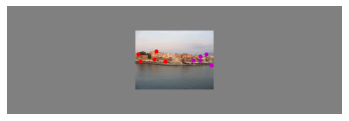

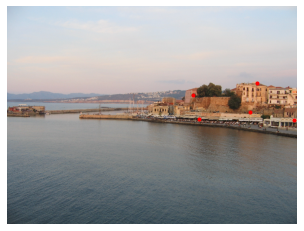

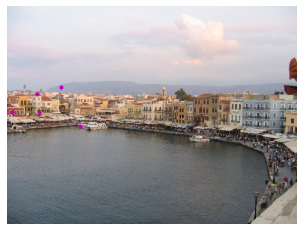

In [2]:
# Load data
data = sio.loadmat('PracticalData.mat', squeeze_me = True);
# Unpack data

# im1 is center image with grey background. im1 has enough space to insert im2 and im3.
im1 = data['im1']

# im2 is left image 
im2 = data['im2']

# pts1 and pts2 are matching points between image1 and image2
pts1 = data['pts1']
pts2 = data['pts2']


# im3 is right image
im3 = data['im3']
# pts1b and pts3 are matching points between image 1 and image 3
pts1b = data['pts1b']
pts3 = data['pts3']

# Show images and points
plt.imshow(im1)
plt.plot(pts1[0,:],pts1[1,:],'r.')
plt.plot(pts1b[0,:],pts1b[1,:],'m.')
plt.axis('off')
plt.show()

plt.imshow(im2)
plt.plot(pts2[0,:],pts2[1,:],'r.')
plt.axis('off')
plt.show()

plt.imshow(im3)
plt.plot(pts3[0,:],pts3[1,:],'m.')
plt.axis('off')
plt.show()

## You should copy paste these functions from 1A. Half the work done! 

In [3]:
def solveAXEqualsZero(A):
    # TODO: Write this routine - it should solve Ah = 0. You can do this using SVD. Consult your notes! 
    # Hint: SVD will be involved. 
    U, L, VT = np.linalg.svd(A)
    V = VT.T
    h = V[:,-1]
    return h

In [4]:
def calcBestHomography(pts1Cart, pts2Cart):
    
    # This function should apply the direct linear transform (DLT) algorithm to calculate the best 
    # homography that maps the cartesian points in pts1Cart to their corresonding matching cartesian poitns 
    # in pts2Cart.
    
    # This function calls solveAXEqualsZero. Make sure you are wary of how to reshape h into a 3 by 3 matrix. 

    n_points = pts1Cart.shape[1]
    
    # TODO: replace this:
    H = np.identity(3)

    # TODO: 
    # First convert points into homogeneous representation
    # Hint: we've done this before  in the skeleton code we provide.
    pts1Hom = np.concatenate((pts1Cart, np.ones((1,pts1Cart.shape[1]))), axis=0)
    pts2Hom = np.concatenate((pts2Cart, np.ones((1,pts2Cart.shape[1]))), axis=0)
    
    # Then construct the matrix A, size (n_points * 2, 9)
    # Consult the notes!
    n_points = pts1Cart.shape[1]

    A = np.zeros((2*n_points,9))
    
    for point in range(n_points):
        #first row in each pair of rows of A
        A[2*point, 3:6] = -1*pts1Hom[:,point]
        A[2*point, 6:9] = pts2Hom[1,point]*pts1Hom[:,point]

        #second row in each pair of rows of A
        A[2*point + 1, 0:3] = pts1Hom[:,point]
        A[2*point + 1, 6:9] = -1*pts2Hom[0,point]*pts1Hom[:,point]



    # Solve Ah = 0 using solveAXEqualsZero and get h.
    h = solveAXEqualsZero(A)
    # Reshape h into the matrix H, values of h go first into rows of H
    H = np.reshape(h, (3,3))
    
    return H

## The Process

Let's consider the first stitch, transforming and pasting `im2` into `im1`. 

We can loop over every location in `im1` and look in `im2` to see if there's a value we can paste in our image. The act of _looking_ into `im2` means that we need to translate from a location in `im1` to a location in `im2`. You can visualize this easily with the point correspondances already provided. For any other point in `im1`, we need a homography! You can use the function you've written before to generate this homography using `pts1` and `pts2`.

So now that we have a way of going from any location in `im1` to `im2`, we can loop over the locations in `im1`, get the corresponding positions in `im2` using the homography, and copy over that pixel value at each location from `im2` to `im1`.

There's one caveat, it's not always true that a transformed location from `im1` will be a valid index in `im2`, so for every index we need to check if it lies in the bounds of `im2`.

Don't worry if your solution takes a while to run. For loops aren't efficient. It might take anywhere from a minute to three for each stitch. You can make this much faster, but don't worry about that right now. 

Again, careful of how you translate between X-Y and R-C in your code when indexing; you've been warned! 

In [5]:
# TODO: Calculate homography from pts1 to pts2 
HEst = calcBestHomography(pts1, pts2)


startTime = time.perf_counter()
# TODO: 
# For every pixel in image 1 (two loops):
for xpix in range(im1.shape[0]):
    print(xpix)
    for ypix in range(im1.shape[1]):

        # Transform this pixel position with your homography to find where it is in the coordinates of image 2
        pts1Cart = np.array([[ypix],[xpix]])
        # Convert points into homogeneous representation
        pts1Hom = np.concatenate((pts1Cart, np.ones((1,pts1Cart.shape[1]))), axis=0)

        # Apply estimated homography to points
        pts2EstHom = np.matmul(HEst,pts1Hom)

        # Convert back to Cartesian coordinates
        pts2EstCart = pts2EstHom[0:2,:] / np.tile([pts2EstHom[2,:]],(2,1))

        # Make sure you round the position using np.round since you'll use it as an index to a matrix.
   
        rowim2 = int(np.round(pts2EstCart[1,0]))
        colim2 = int(np.round(pts2EstCart[0,0]))

        
        # If it the transformed position is within the boundary of image 2: 
        if(0<=rowim2<=im2.shape[0] - 1):
            if(0<=colim2<=im2.shape[1] - 1):
                #Copy pixel colour from image 2 pixel to current position in image 1
                im1[xpix,ypix,:] = im2[rowim2, colim2,:]
            
print("Stitching image 2 to image 1 took: {0:.2f}s".format(time.perf_counter() - startTime))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

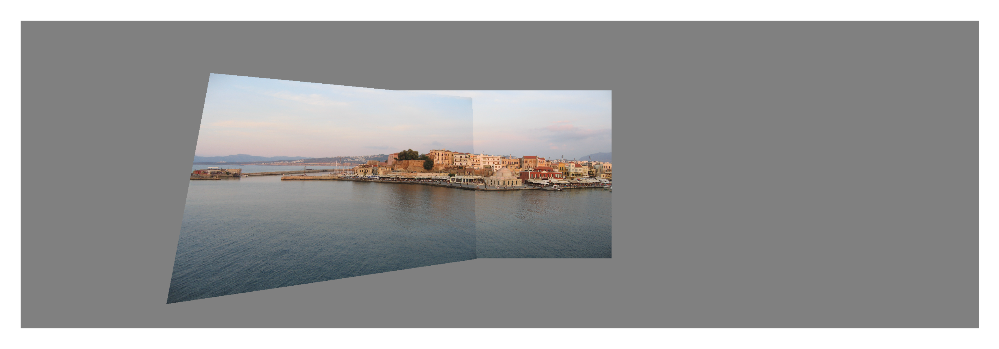

In [6]:
# Plot the intermediate panorama
figure(figsize=(6,6), dpi=700)
plt.imshow(im1)
plt.axis('off')
plt.show()

In [7]:
# TO DO: Repeat the above process mapping image 3 to image 1.

# Calculate homography from pts1b to pts3
HEst = calcBestHomography(pts1b, pts3)
startTime = time.perf_counter()


# loop and copy pixels...
# TODO: 
# For every pixel in image 1 (two loops):
for xpix in range(im1.shape[0]):
    print(xpix)
    for ypix in range(im1.shape[1]):

        # Transform this pixel position with your homography to find where it is in the coordinates of image 3
        pts1Cart = np.array([[ypix],[xpix]])
        # Convert points into homogeneous representation
        pts1Hom = np.concatenate((pts1Cart, np.ones((1,pts1Cart.shape[1]))), axis=0)

        # Apply estimated homography to points
        pts3EstHom = np.matmul(HEst,pts1Hom)

        # Convert back to Cartesian coordinates
        pts3EstCart = pts3EstHom[0:2,:] / np.tile([pts3EstHom[2,:]],(2,1))

        # Make sure you round the position using np.round since you'll use it as an index to a matrix.
        rowim3 = int(np.round(pts3EstCart[1,0]))
        colim3 = int(np.round(pts3EstCart[0,0]))

        
        # If it the transformed position is within the boundary of image 3: 
        if(0<=rowim3<=im3.shape[0] - 1):
            if(0<=colim3<=im3.shape[1] - 1):
                #Copy pixel colour from image 3 pixel to current position in image 1
                im1[xpix,ypix,:] = im3[rowim3, colim3,:]
print("Stitching image 3 to image 1 took: {0:.2f}s".format(time.perf_counter() - startTime))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

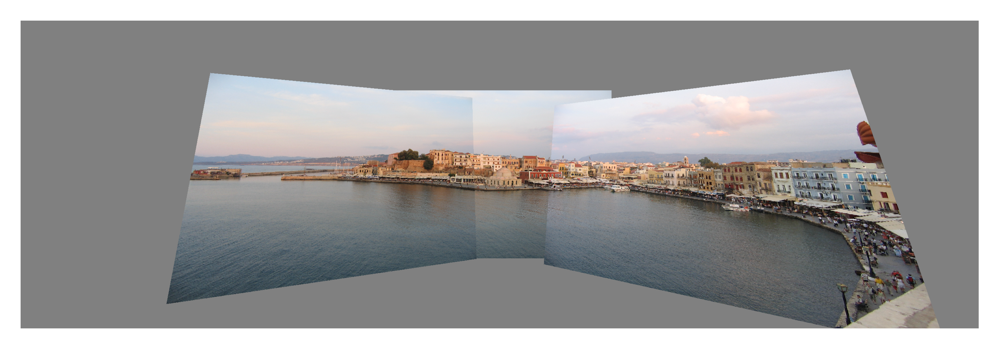

In [8]:
# Plot the final panorama
figure(figsize=(6,6), dpi=700)
plt.imshow(im1)
plt.axis('off')
plt.show()

As we can see the final stitch looks very good. From what I can see, the stitching between im1 and im3 looks a bit better than between im1 and im2. I say this because the stitchline is still visible near the buildings for the stitching of im1 and im2. Whereas, the stichline almost fades away (is not that visible) near the buildings for the stitching between im3 and im1.

### _Fun_ task for those who have finished all four parts (1A, 1B, 2A, and 2B):

__SPEED__.... I _am_ speed.

Do __NOT__ do this unless you've finished all four parts, want a challenge, and an exercise in numpy and vectorization. 

For loops are slow. Can you think of ways of making it faster with vectorized code? You can definitely bring it down to at least a second per stitch and maybe even lower. Speak to the TAs if you want, but you would need to figure this out for yourself as a good exercise.


In [9]:
# Load data
data = sio.loadmat('PracticalData.mat', squeeze_me = True);
# Unpack data

# im1 is center image with grey background. im1 has enough space to insert im2 and im3.
im1 = data['im1']

# im2 is left image 
im2 = data['im2']

# pts1 and pts2 are matching points between image1 and image2
pts1 = data['pts1']
pts2 = data['pts2']


# im3 is right image
im3 = data['im3']
# pts1b and pts3 are matching points between image 1 and image 3
pts1b = data['pts1b']
pts3 = data['pts3']

In [10]:
# TODO: Calculate homography from pts1 to pts2 
HEst = calcBestHomography(pts1, pts2)
startTime = time.perf_counter()

#unravelling meshgrid containing all combinations of xpix and ypix values
pts1Cart = (((np.array(np.meshgrid(np.arange(im1.shape[1]), np.arange(im1.shape[0])))).T).reshape(-1,2)).T #all the xpix and ypix are stored in reverse as [[ypix], [xpix]]
# Transform this pixel position with your homography to find where it is in the coordinates of image 2
# Convert points into homogeneous representation
pts1Hom = np.concatenate((pts1Cart, np.ones((1,pts1Cart.shape[1]))), axis=0)
# Apply estimated homography to points
pts2EstHom = np.matmul(HEst,pts1Hom)

# Convert back to Cartesian coordinates
pts2EstCart = pts2EstHom[0:2,:] / np.tile([pts2EstHom[2,:]],(2,1))

# Make sure you round the position using np.round since you'll use it as an index to a matrix.
rowim2 = (np.round(pts2EstCart[[1],:])).astype(int)
colim2 = (np.round(pts2EstCart[[0],:])).astype(int)

#stacking indices for im1 and im2 so that we can get rid of columns that contain invalid out of bounds values
stacked_indices = np.vstack((pts1Cart, rowim2, colim2))


#masks to keep only indices within bounds
indexmask1 = (0<=stacked_indices[2,:]) & (stacked_indices[2,:]<=(im2.shape[0] - 1))
indexmask2 = (0<=stacked_indices[3,:]) & (stacked_indices[3,:]<=(im2.shape[1] - 1))
valid_indices = stacked_indices[:,indexmask1&indexmask2]

# If the transformed position is within the boundary of image 2:
#Copy pixel colour from image 2 pixel to current position in image 1
#note that xpix and ypix were stored in reverse order so thats why we have to reverse it again when indexing for im1
im1[valid_indices[1,:],valid_indices[0,:],:] = im2[valid_indices[2,:], valid_indices[3,:],:]
print("Stitching image 2 to image 1 took: {0:.2f}s".format(time.perf_counter() - startTime))


Stitching image 2 to image 1 took: 0.54s


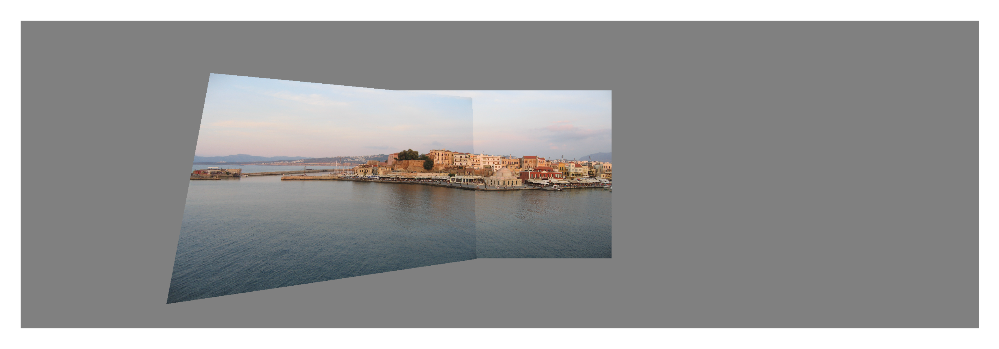

In [11]:
# Plot the intermediate panorama
figure(figsize=(6,6), dpi=700)
plt.imshow(im1)
plt.axis('off')
plt.show()

In [12]:
# TODO: Calculate homography from pts1 to pts2 
HEst = calcBestHomography(pts1b, pts3)
startTime = time.perf_counter()

#unravelling meshgrid containing all combinations of xpix and ypix values
pts1Cart = (((np.array(np.meshgrid(np.arange(im1.shape[1]), np.arange(im1.shape[0])))).T).reshape(-1,2)).T #all the xpix and ypix are stored in reverse as [[ypix], [xpix]]
# Transform this pixel position with your homography to find where it is in the coordinates of image 2
# Convert points into homogeneous representation
pts1Hom = np.concatenate((pts1Cart, np.ones((1,pts1Cart.shape[1]))), axis=0)
# Apply estimated homography to points
pts3EstHom = np.matmul(HEst,pts1Hom)

# Convert back to Cartesian coordinates
pts3EstCart = pts3EstHom[0:2,:] / np.tile([pts3EstHom[2,:]],(2,1))

# Make sure you round the position using np.round since you'll use it as an index to a matrix.
rowim3 = (np.round(pts3EstCart[[1],:])).astype(int)
colim3 = (np.round(pts3EstCart[[0],:])).astype(int)

#stacking indices for im1 and im3 so that we can get rid of columns that contain invalid out of bounds values
stacked_indices = np.vstack((pts1Cart, rowim3, colim3))


#masks to keep only indices within bounds
indexmask1 = (0<=stacked_indices[2,:]) & (stacked_indices[2,:]<=(im3.shape[0] - 1))
indexmask2 = (0<=stacked_indices[3,:]) & (stacked_indices[3,:]<=(im3.shape[1] - 1))
valid_indices = stacked_indices[:,indexmask1&indexmask2]

# If the transformed position is within the boundary of image 3:
#Copy pixel colour from image 3 pixel to current position in image 1
#note that xpix and ypix were stored in reverse order so thats why we have to reverse the order when indexing for im1
im1[valid_indices[1,:],valid_indices[0,:],:] = im3[valid_indices[2,:], valid_indices[3,:],:]
print("Stitching image 3 to image 1 took: {0:.2f}s".format(time.perf_counter() - startTime))

Stitching image 3 to image 1 took: 0.58s


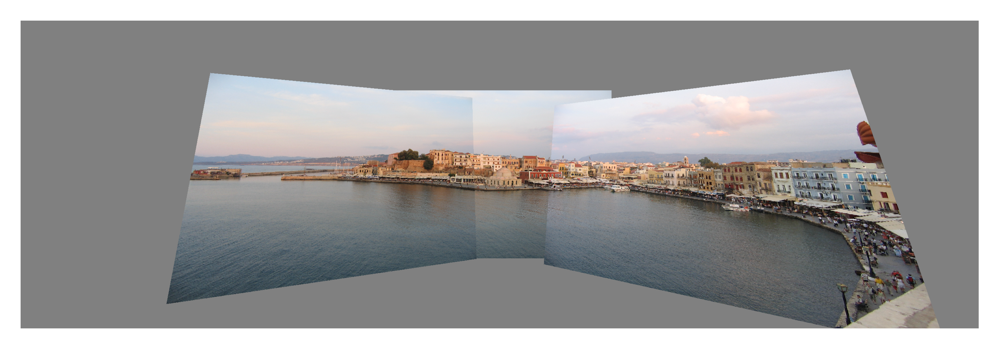

In [13]:
# Plot the final panorama
figure(figsize=(6,6), dpi=700)
plt.imshow(im1)
plt.axis('off')
plt.show()

Vectorising made the stitching much faster, taking each stitching down to almost half a second in comparison to over a minute using for loops.